# Import all packages

In [7]:
# Import all packages
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using OrdinaryDiffEq
Random.seed!(145975);
# using CmdStan
using KernelDensity
using LaTeXStrings
using StatsBase

using BlackBoxOptim
using BlackBoxOptim: num_func_evals
using HypothesisTests
using BayesianOptimization, GaussianProcesses
using JLD2

# set_cmdstan_home!("C:\\cmdstan\\cmdstan-2.30.0");

In [8]:
# include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\FunctionsBayesInfs.jl")
include("E:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\FunctionsBayesInfs.jl")

restructDatInfCompRep_RealExpDat_FixScF (generic function with 1 method)

In [9]:
# -------------------------------------------------------------------- Michaelis Menten Kinetics --------------------------------------------------------------------
function PyruvateHP_CellsMM!(du, u, p, t)

    Pout, Pin, LDH, LDHPyr, Lac = u;
    kin, kf, kr, kpl, T1_P, T1_L = p;

    du[1] = dPout = -Pout*kin - Pout/T1_P
    du[2] = dPin = Pout*kin + kr*LDHPyr - kf*Pin*LDH - Pin/T1_P
    du[3] = dLDH = kr*LDHPyr + kpl*LDHPyr - kf*Pin*LDH
    du[4] = dLDHPyr = kf*Pin*LDH - kr*LDHPyr - kpl*LDHPyr - LDHPyr/T1_P
    du[5] = dLac = kpl*LDHPyr - (Lac/T1_L)

end


function PyruvateHP_NMR_SolveAllMM(ts, pD, ivss, samps)

    if length(size(pD)) == 1
        pD = reshape(pD,size(pD)[1],1);
    end

    if size(pD)[2] != 7     
        pD = pD';
    end

    if length(ivss)/5 > 1
        if size(ivss)[2] != 5
            ivss = ivss';
        end
    end

    AllSolTest = zeros(length(samps), 5, length(pD[:,1])); # Simulation of the system observed
    AllSolTest_Off = Array{Any,1}(undef,length(pD[:,1])); # Simulation of the system before we obvserve it (considering time offset). First column is the time vector
    AllSolTest_Tog = Array{Any,1}(undef,length(pD[:,1])); # Previous two together. First column is the time vector. 


    
    for drawInd in collect(1:length(pD[:,1]))
        
        p = pD[drawInd,1:end-1];
        tau = pD[drawInd,end];
        
        if length(ivss)/5 > 1
            ivss2 = ivss[drawInd,:];
        else
            ivss2 = ivss;
        end
    
        # Account for the time offset
    
            prob_off = ODEProblem(PyruvateHP_CellsMM!,ivss2,(-tau, 0),p);
            part1_off = DifferentialEquations.solve(prob_off, CVODE_BDF(),reltol=1.0e-9,abstol=1.0e-9);
        
            ivss2 = part1_off.u[end];
        
            prob = ODEProblem(PyruvateHP_CellsMM!,ivss2,(ts[1], ts[end]),p);
            part1 = DifferentialEquations.solve(prob, CVODE_BDF(),reltol=1.0e-9,abstol=1.0e-9,saveat=1);
        
        
        AllSolTest[:,:,drawInd]
    
        tmp = zeros(length(part1_off.u), 5);

        for j in 1:5
            AllSolTest[:,j,drawInd] = [part1.u[i][j] for i in 1:length(part1.u)][samps.+1];
            tmp[:,j] = [part1_off.u[i][j] for i in 1:length(part1_off.u)];
        end

        AllSolTest_Off[drawInd] = hcat(part1_off.t, tmp);
        AllSolTest_Tog[drawInd] = vcat(AllSolTest_Off[drawInd][1:end-1, :], hcat(samps, AllSolTest[:,:,drawInd]));
    
    end

    return AllSolTest, AllSolTest_Off, AllSolTest_Tog

end

PyruvateHP_NMR_SolveAllMM (generic function with 1 method)

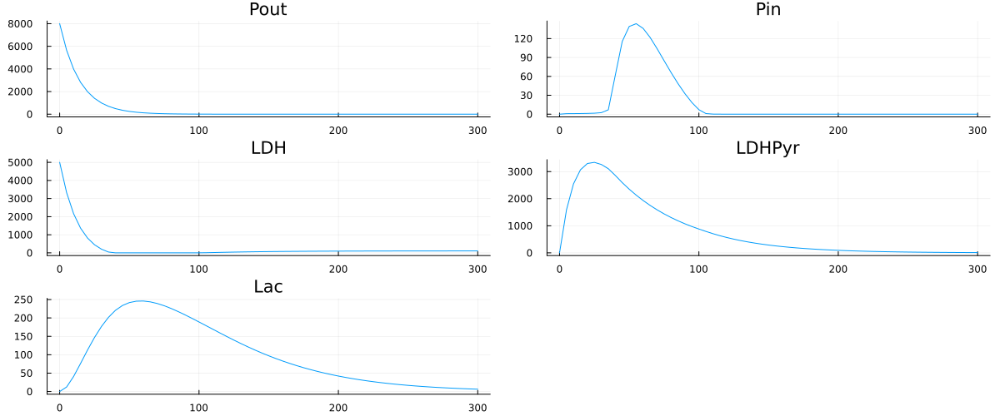

In [10]:
# Pout, Pin, LDH, LDHPyr, Lac, LacHyper, PyrHyper, Obs_LacHyper, Obs_PyrHyper = u;
# kin, kf, kr, kpl, T1_P, T1_L, ScFm = p;

ts = 0:300
samps = collect(0:5:300);
ivss = [8000, 0, 1000*5, 0, 0];
pD = [0.01*5, 0.1, 0.0001, 0.003, 51, 41, 0]


mmSIM = PyruvateHP_NMR_SolveAllMM(ts, pD, ivss, samps)

p1=plot(samps, mmSIM[1][:,1,:], label = "", title = "Pout"); p2=plot(samps, mmSIM[1][:,2,:], label = "", title = "Pin"); p3 = plot(samps, mmSIM[1][:,3,:], label = "", title = "LDH")
p4=plot(samps, mmSIM[1][:,4,:], label = "", title = "LDHPyr"); p5=plot(samps, mmSIM[1][:,5,:], label = "", title = "Lac");
plot(p1,p2,p3,p4,p5, layout=(3,2), size = (1200,500))

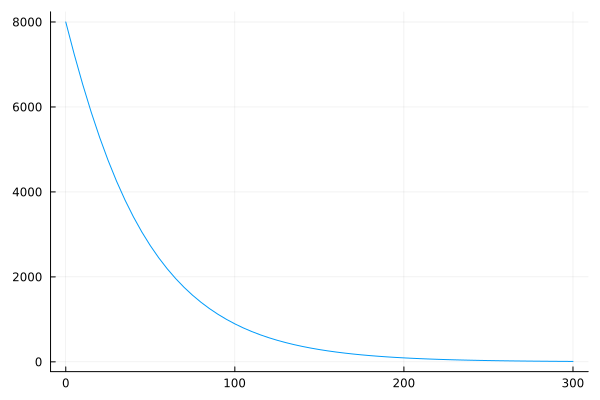

In [5]:
plot(samps, mmSIM[1][:,1,:]+mmSIM[1][:,2,:]+mmSIM[1][:,4,:], label = "")

# Extract Data in Stan Format

In [12]:
# mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\";
mainpath = "E:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\";
paths = [mainpath*"4Mil_Dat.csv"]

1-element Vector{String}:
 "E:\\IBECPostDocDrive\\2024_01_16_" ⋯ 26 bytes ⋯ "ence\\ProcessedData\\4Mil_Dat.csv"

In [13]:
Random.seed!(8987654);
global dat = restructDatInfMM(paths, rand(Truncated(Normal(550, 275), 0, 1600), 1)[1])

Dict{String, Any} with 14 entries:
  "Means"  => [7114.49; 5374.68; … ; -1.15072; 0.143625;;; 0.0; 35.8707; … ; 1.…
  "stsl"   => [78;;]
  "obSta"  => [1 2]
  "sts"    => [0; 15; … ; 390; 395;;]
  "obser"  => 2
  "Y0us"   => [7114.49; 0.0; … ; 0.0; 0.0;;]
  "ts"     => [1.0e-20; 1.0; … ; 394.0; 395.0;;]
  "itp"    => [0.0]
  "ncells" => [4;;]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [706.515; 455.928; … ; 3.06334; 4.51173;;; 1.0; 11.6823; … ; 1.0;…
  "m"      => 1
  "nts"    => [395;;]

# MLE to obtain a good first guess for inference

In [14]:
function ObjectFunctMEMM_Multi_MLE(p)

    # Define parameter vectors for each amount of cells (last parameter is a time delay, not used in here)
    pD2 = vcat(p[1:end-1], 0);
    obj = 0;
    
    for i in 1:length(dat["stsl"])
        # Define time vector
        t2cor = dat["sts"][:,i];

        # Define equaly-spaced time vector
        ts1 = collect(0:t2cor[end]);

        # Define initial value for simulation (use of experimental mean)
        ivss1 = [dat["Means"][1,i,1], 0, p[end], 0, 0];

        # Convert sampling vector to integer to extract correct elements from simulation
        samps1 = convert.(Int, t2cor);

        # Simulate
        SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllMM(ts1, pD2, ivss1, samps1);
    
        mm22 = sum((-1/2) .* (log(2*pi) .+ log.(dat["Erros"][:,i,2].^2) .+ ((SimOnTime1[:,5] .- dat["Means"][:,i,2]).^2)./(dat["Erros"][:,i,2].^2)));

        # obj = (mm21+mm22)*(mm11+mm12);
        if p[end-2] >= p[end-1]
            mm22 = mm22*10;
        end
        obj = -(mm22)+obj;
    end
    
    return(obj)

end

ObjectFunctMEMM_Multi_MLE (generic function with 1 method)

In [15]:
ObjectFunctMEMM_Multi_MLE([0.0010, 0.01, 0.0001, 0.9, 51, 41, 700/(15*0.12)])

3268.9583597351184

In [15]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMEMM_Multi_MLE, [0.0010, 0.01, 0.0001, 0.3, 51, 41, 700]; SearchRange = [(1e-10,0.2),(1e-10,0.5),(1e-10,1.1),(1e-10,0.4),(51,51),(41,41),(300, 16000)], # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*2, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.50 secs, 282 evals, 201 steps, improv/step: 0.413 (last = 0.4129), fitness=2264.377623467
1.04 secs, 523 evals, 431 steps, improv/step: 0.378 (last = 0.3478), fitness=2246.358213735
1.76 secs, 788 evals, 708 steps, improv/step: 0.342 (last = 0.2852), fitness=2246.358213735
2.41 secs, 1071 evals, 1013 steps, improv/step: 0.295 (last = 0.1869), fitness=2246.354324727
2.91 secs, 1532 evals, 1508 steps, improv/step: 0.265 (last = 0.2040), fitness=2246.354324727
3.42 secs, 1981 evals, 1986 steps, improv/step: 0.244 (last = 0.1757), fitness=2238.818694264
3.92 secs, 2442 evals, 2478 steps, improv/step: 0.225 (last = 0.1504), fitness=2209.501144471
4.43 secs, 2869 evals, 2932 steps, improv/step: 0.218 (last = 0.1784), fitness=2209.501144471
4.93 secs, 3270 evals, 3355 steps, improv/step: 0.

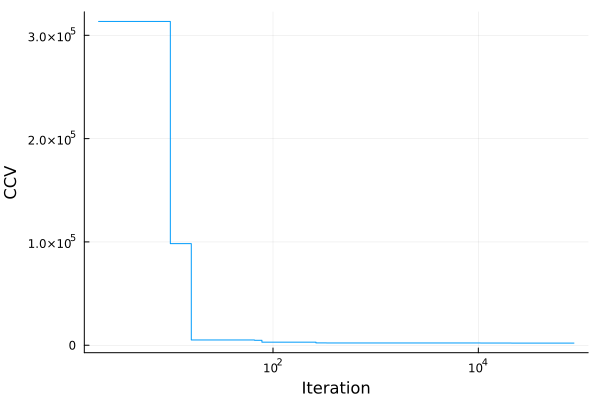

In [16]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [17]:
# Extract Parameter Vector
parfitT = zeros(7, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

7-element Vector{Float64}:
   0.00579394041770033
   0.011060913234093884
   1.0999999920785724
   0.022451842139448123
  51.0
  41.0
 300.0000001911051

In [18]:
JLD2.save("MLEResults\\resMTRRMM_Exper_Init_Try2.jld2", "FitsT",FitsT)
JLD2.save("MLEResults\\resMVectTRRMM_Exper_Init_Try2.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

┌ Warning: Attempting to store var"#71#72".
│ JLD2 only stores functions by name.
│  This may not be useful for anonymous functions.
└ @ JLD2 C:\Users\dgomez\.julia\packages\JLD2\nPYlZ\src\data\writing_datatypes.jl:447
┌ Warning: Attempting to store BlackBoxOptim.var"#114#115".
│ JLD2 only stores functions by name.
│  This may not be useful for anonymous functions.
└ @ JLD2 C:\Users\dgomez\.julia\packages\JLD2\nPYlZ\src\data\writing_datatypes.jl:447


In [16]:
ppT = JLD2.load("MLEResults\\resMVectTRRMM_Exper_Init_Try2.jld2")["resMMat"][:,1]


7-element Vector{Float64}:
   0.00579394041770033
   0.011060913234093884
   1.0999999920785724
   0.022451842139448123
  51.0
  41.0
 300.0000001911051

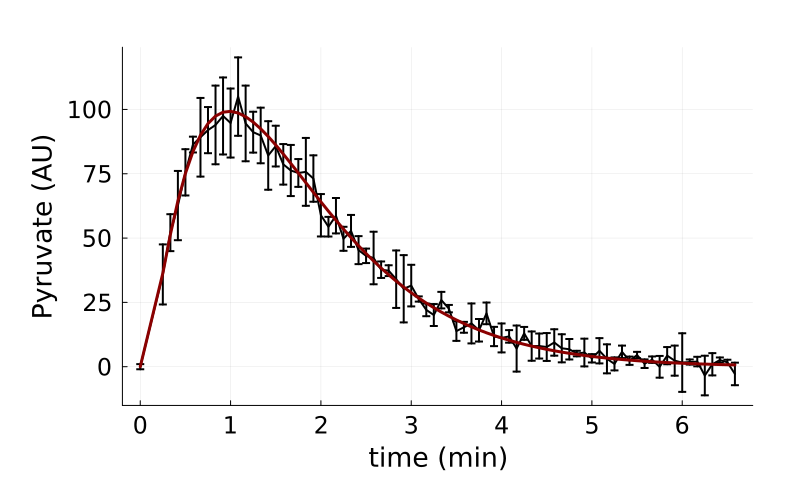

In [17]:
# ppT = [100, 0.00001, 0.001, 0.1, 51, 41, 15000000]

# Plot Simulation with best estimate against data
tsC2 = dat["sts"];
ts = 0:tsC2[end];
ivss = [dat["Means"][1,1,1], 0, ppT[7], 0, 0];;
samps = convert.(Int, tsC2);

SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllMM(ts, vcat(ppT[1],ppT[2:5],ppT[6], 0), ivss, samps);

pps = plot(dat["sts"]./60, dat["Means"][:,1,2], yerror = dat["Erros"][:,1,2], linewidth = 2, colour = "black", label = "",
            margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
            xlabel = "time (min)", ylabel = "Pyruvate (AU)", size = (800,500))

     plot!(tsC2./60, SimulsAll[:,5,1], linewidth=3, colour="red4", label = "")

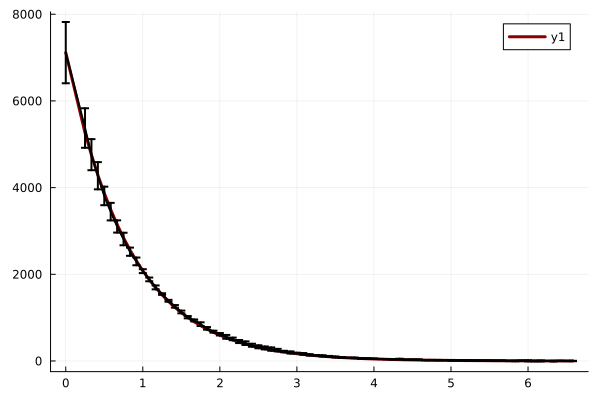

In [20]:
plot(tsC2./60, SimulsAll[:,1,1]+SimulsAll[:,2,1]+SimulsAll[:,4,1], linewidth=3, colour="red4")
plot!(dat["sts"]./60, dat["Means"][:,1,1], yerror = dat["Erros"][:,1,1], linewidth = 2, colour = "black", label = "")

In [22]:
ppT

7-element Vector{Float64}:
   0.00579394041770033
   0.011060913234093884
   1.0999999920785724
   0.022451842139448123
  51.0
  41.0
 300.0000001911051

## Compute structure for Stan's initial guess

In [18]:
# include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\FunctionsBayesOED.jl")
include("E:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\FunctionsBayesOED.jl")

redSamples (generic function with 2 methods)

In [19]:
# preTrans = zeros(5);

# preTrans[1] = ppT[1]*(2-(-2))/(1-0)+(-2); 
# preTrans[2] = ppT[2]*(2-(-2))/(1-0)+(-2); 
# preTrans[3] = ppT[3]*(2-(-2))/(1-0)+(-2);          
# preTrans[4] = ppT[4]*(2-(-2))/(1-0)+(-2);

# preTrans[5] = (ppT[end]-550)/275;

preTrans = zeros(5);

preTrans[1] = ppT[1]*(2-(-2))/(0.2-1e-10)+(-2); 
preTrans[2] = ppT[2]*(2-(-2))/(0.5-1e-10)+(-2); 
preTrans[3] = ppT[3]*(2-(-2))/(1.1-1e-10)+(-2);          
preTrans[4] = ppT[4]*(2-(-2))/(0.4-1e-10)+(-2);

preTrans[5] = (ppT[end]-550)/275;

In [20]:

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kf","kr","kpl","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kin" => -1.884121191588054, "kr" => 1.9999999715584447, "kf" => -1.9115126941095515, "kpl" => -1.7754815785493892, "LDH" => -0.9090909083959815)
 Dict("kin" => -1.884121191588054, "kr" => 1.9999999715584447, "kf" => -1.9115126941095515, "kpl" => -1.7754815785493892, "LDH" => -0.9090909083959815)
 Dict("kin" => -1.884121191588054, "kr" => 1.9999999715584447, "kf" => -1.9115126941095515, "kpl" => -1.7754815785493892, "LDH" => -0.9090909083959815)
 Dict("kin" => -1.884121191588054, "kr" => 1.9999999715584447, "kf" => -1.9115126941095515, "kpl" => -1.7754815785493892, "LDH" => -0.9090909083959815)

In [24]:
ini[1]

Dict{String, Any} with 5 entries:
  "kin" => -1.88412
  "kr"  => 2.0
  "kf"  => -1.91151
  "kpl" => -1.77548
  "LDH" => -0.909091

# Bayesian Inference

In [30]:
modelpath = "HP_PyrLac_MichMentModel.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrMichMent_Try2", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [31]:
rc, chns, cnames = stan(StanModel, dat)#, init = ini) 
# Runs in about 35 min


Inference for Stan model: PyrMichMent_Try2_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (5863, 5857, 6038, 6003) seconds, 6.6 hours total
Sampling took (14243, 14054, 13603, 14332) seconds, 16 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -5.3e+02  3.5e-02  1.7e+00  -5.4e+02  -5.3e+02  -5.3e+02  2.4e+03  4.2e-02  1.0e+00
accept_stat__    9.6e-01  9.8e-04  6.6e-02   8.3e-01   9.9e-01      1.00  4.5e+03  8.1e-02  1.0e+00
stepsize__       7.0e-03  4.2e-04  2.1e-03   3.9e-03   7.0e-03     0.011  2.6e+01  4.6e-04  1.0e+00
treedepth__      9.3e+00  1.5e-02  1.2e+00   7.0e+00   1.0e+01        10  7.0e+03  1.2e-01  1.0e+00
n_leapfrog__     8.3e+02  3.7e+00  3.1e+02   1.6e+02   1.0e+03      1023  7.1e+03  1.3e-01  1.0e+00
divergent__      0.0e+00      nan  0.0e+00   0.0e+00   0.0e+00      0.00      nan      nan      nan
e

(0, [-3162.0 1.0 … 41.0 0.0024474; -3162.0 0.0 … 41.0 0.0024474; … ; -533.702 0.877865 … 41.0 543.511; -534.709 0.995975 … 41.0 860.301;;; -2264.08 1.0 … 41.0 194.165; -2264.08 0.0 … 41.0 194.165; … ; -531.956 0.997368 … 41.0 395.166; -534.764 0.933835 … 41.0 179.656;;; -2868.19 1.0 … 41.0 82.7072; -2868.19 0.0 … 41.0 82.7072; … ; -532.985 0.985741 … 41.0 246.017; -531.994 0.993624 … 41.0 471.035;;; -9847.59 1.0 … 41.0 202.906; -9847.59 0.0 … 41.0 202.906; … ; -532.662 0.998662 … 41.0 171.838; -532.227 0.989761 … 41.0 307.222], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kf", "kr"  …  "T1_P", "T1_X", "LDH", "theta.1", "theta.2", "theta.3", "theta.4", "theta.5", "theta.6", "inits.1"])

In [25]:
using JLD2

In [26]:
JLD2.save("Results\\PyrMichMentInferRes_Try2.jld", "rc", rc, "chns", chns, "cnames", cnames)

UndefVarError: UndefVarError: `rc` not defined

In [34]:
poster = vcat(chns[1001:end, end-6:end, 1], chns[1001:end, end-6:end, 2], chns[1001:end, end-6:end, 3], chns[1001:end, end-6:end, 4])
JLD2.save("Results\\PosteriorMichMent_Try2.jld", "poster", poster)
CSV.write("Results\\PosteriorMichMent_Try2.csv", DataFrame(poster, :auto))

"Results\\PosteriorMichMent_Try2.csv"

In [21]:
poster = Matrix(CSV.read("Results\\PosteriorMichMent_Try2.csv", DataFrame))

8000×7 Matrix{Float64}:
 0.0016384   0.0445349    0.627406  0.071002   51.0  41.0   94.6426
 0.00500357  0.0226459    1.0497    0.0183608  51.0  41.0  349.517
 0.0159774   0.00105144   0.405988  0.0431522  51.0  41.0  165.095
 0.0140031   0.00235966   0.963485  0.035468   51.0  41.0  196.779
 0.00668947  0.0060183    0.254642  0.0121594  51.0  41.0  531.476
 0.00612288  0.0120965    1.03368   0.0218686  51.0  41.0  302.102
 0.00540892  0.040637     0.741233  0.0146092  51.0  41.0  441.274
 0.0169148   0.00160778   0.753713  0.0169337  51.0  41.0  428.036
 0.00492013  0.0109949    0.757114  0.033706   51.0  41.0  194.017
 0.0168865   0.000808358  0.558938  0.0367969  51.0  41.0  202.368
 0.00217069  0.0149949    0.466922  0.0643792  51.0  41.0  103.191
 0.00992539  0.00566247   1.02172   0.0121403  51.0  41.0  549.745
 0.0140076   0.00557347   1.01465   0.0112597  51.0  41.0  589.54
 ⋮                                                    ⋮    
 0.0104652   0.00302076   0.766245  0.190797 

In [22]:
mean(poster, dims = 1)

1×7 Matrix{Float64}:
 0.00718396  0.0534043  0.712065  0.0561545  51.0  41.0  321.846

In [38]:
std(poster, dims = 1)

1×7 Matrix{Float64}:
 0.00545841  0.0937517  0.272043  0.0763669  0.0  0.0  249.67

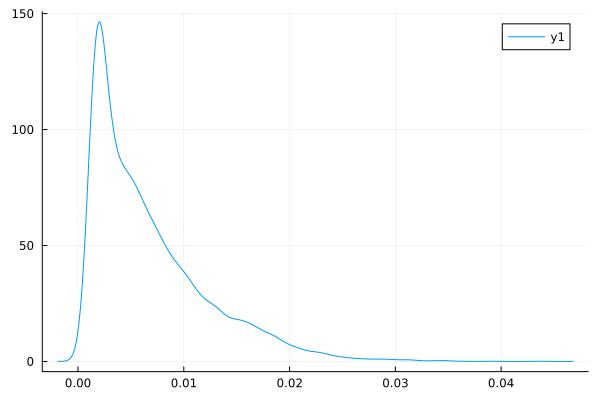

# Plot Posteriors Against Priors

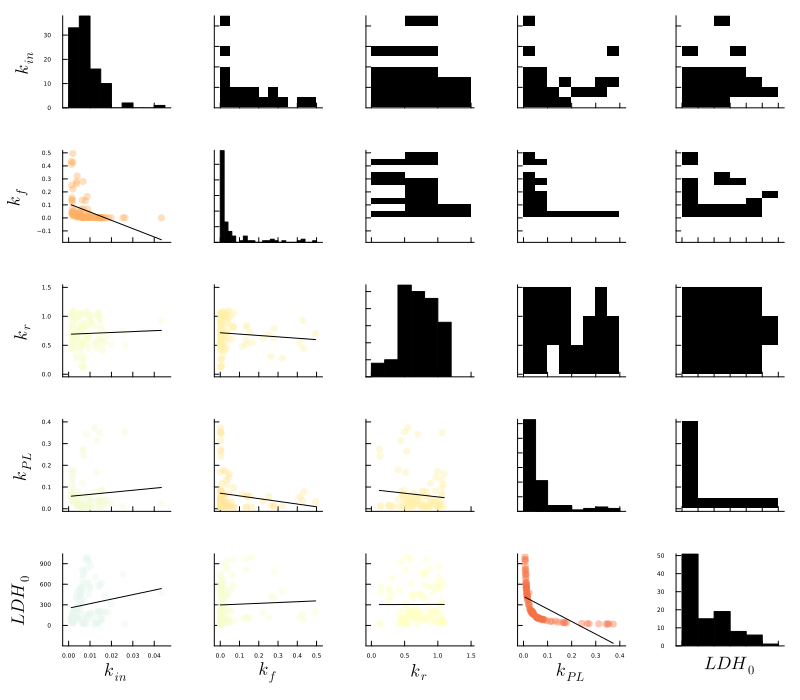

In [29]:
pc = corrplot(poster[1:100, [1,2,3,4,7]], label = [L"k_{in}",L"k_{f}",L"k_{r}",L"k_{PL}",L"LDH_0"])

fp1 = plot(pc, size=(800,700), xtickfont=font(4), ytickfont=font(4), guidefont=font(12), margin = 2mm, grid=false)


# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorNoTransporterCorr.svg")
# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorNoTransporterCorr.png")


display(fp1)

In [25]:
using CairoMakie
using PairPlots
using DataFrames

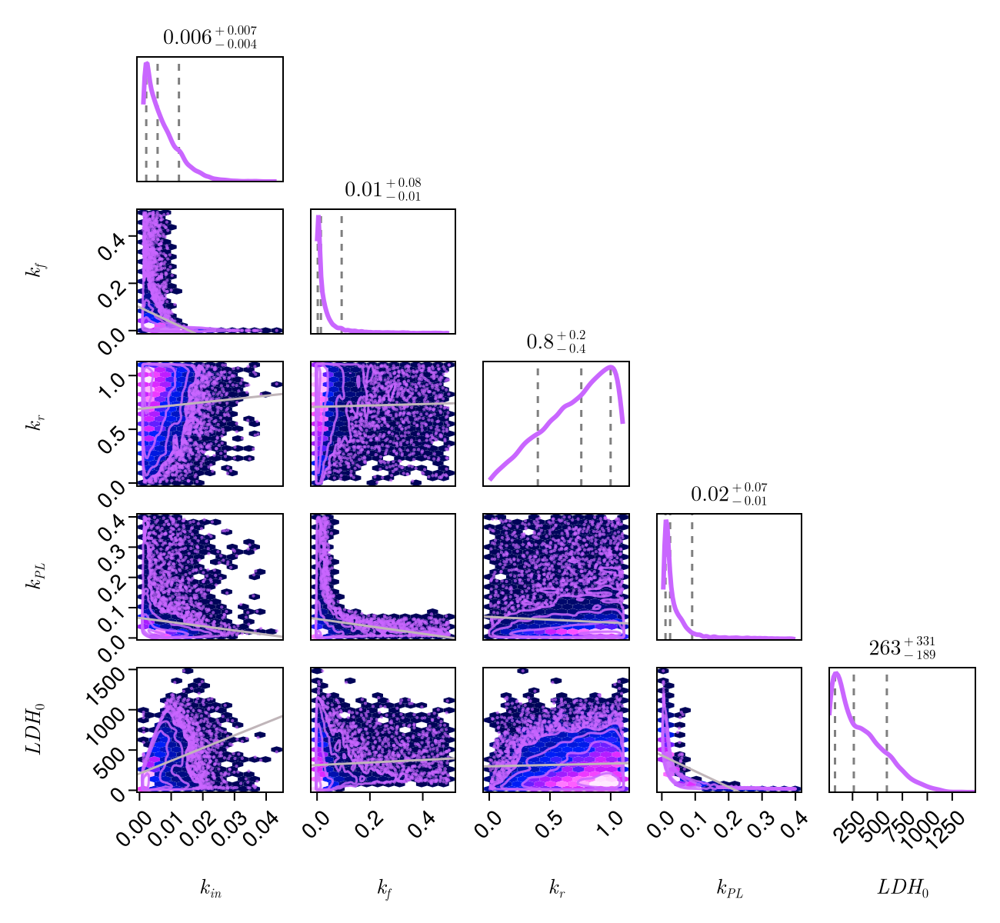

In [32]:
label = [L"k_{in}",L"k_{f}",L"k_{r}",L"k_{PL}",L"LDH_0"]
df = DataFrame(poster[:,[1,2,3,4,7]], :auto)


fig = Figure(size=(650,600))
# 
pairplot(fig[1,1], df => (
    PairPlots.HexBin(colormap=:linear_bmw_5_95_c89_n256, alpha=1), # RdYlGn
    PairPlots.Scatter(filtersigma=2, color="#c966ffff", markersize=3, alpha=0.65),
    PairPlots.Contour(color="#c966ffff", alpha=0.85),
    # # New:
    
    PairPlots.MarginConfidenceLimits(),
    PairPlots.MarginDensity(color="#c966ffff", linewidth=3),
    PairPlots.TrendLine(color="#c0b5b9ff"), # default is red
    
), 
labels = Dict(:x1 => label[1],:x2 => label[2],:x3 => label[3],:x4 => label[4],:x5 => label[5]))

# save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\PosteriorMichMentCorr_NEW.svg", fig)
save("E:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\PosteriorMichMentCorr_NEW.svg", fig)


fig

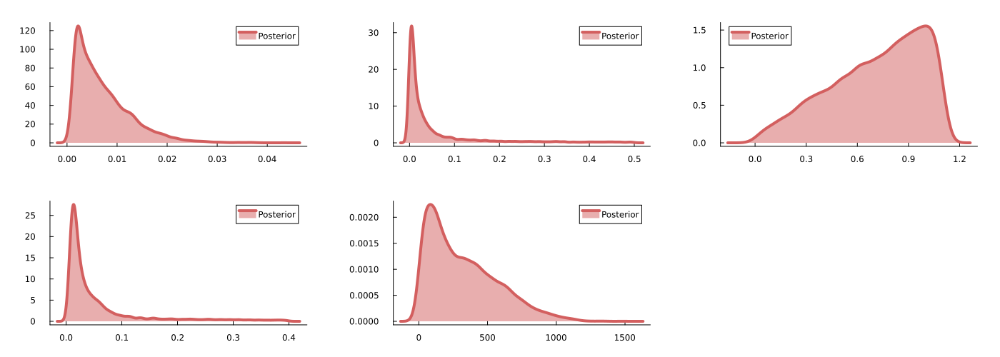

In [34]:
p1 = plot(kde(poster[:,1]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p2 = plot(kde(poster[:,2]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p3 = plot(kde(poster[:,3]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p4 = plot(kde(poster[:,4]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p5 = plot(kde(poster[:,7]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))


plot(p1,p2,p3,p4,p5, size = (1400,500), margin = 6mm, grid=false)

# savefig("PosteriorTest.svg")

plot(p1,p2,p3,p4,p5, size = (1400,500), margin = 6mm, grid=false)


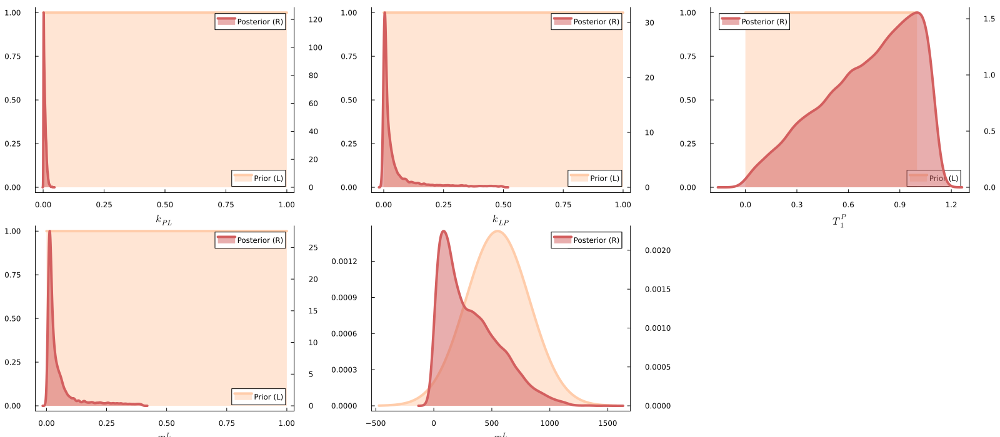

In [35]:
p1 = plot(Uniform(0, 1), label = "Prior (L)", xlabel = L"k_{PL}", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,1]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p2 = plot(Uniform(0, 1), label = "Prior (L)", xlabel = L"k_{LP}", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,2]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p3 = plot(Uniform(0, 1), label = "Prior (L)", xlabel = L"T_1^P", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,3]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p4 = plot(Uniform(0, 1), label = "Prior (L)", xlabel = L"T_1^L", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,4]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p5 = plot(Normal(550, 275), label = "Prior (L)", xlabel = L"T_1^L", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,7]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))


plot(p1,p2,p3,p4,p5, size = (1600,700), margin = 10mm, grid=false)

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PriorPosteriorMichMent.svg")

plot(p1,p2,p3,p4,p5, size = (1600,700), margin = 10mm, grid=false)


# Simulate Posterior Prediction (Quantiles)

In [36]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")

PyruvateHP_NMR_SolveAllMM (generic function with 1 method)

In [37]:
dat4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

dat = [dat4];

## Prior Prediction (Check)

In [39]:
Random.seed!(12354987895); 

kin = rand(Uniform(0, 1), 8000);
kf = rand(Uniform(0, 1), 8000);
kr = rand(Uniform(0, 1), 8000);
kpl = rand(Uniform(0, 1), 8000);
ldh = rand(Normal(550, 275), 8000);
T1P = ones(8000).*51;
T1L = ones(8000).*41;

prior4 = hcat(kin, kf, kr, kpl, T1P, T1L, zeros(8000));


In [40]:
priorSims = Array{Any}(undef, 8000)
tsC4 = dat4[:,1]
ts = 0:tsC4[end];
samps = convert.(Int, tsC4);

for i in 1:8000

    ivss = [dat4[1,2], 0, ldh[i], 0, 0];
    SimOnTime2prior, SimOffTime2prior, SimAll2prior  = PyruvateHP_NMR_SolveAllMM(ts, prior4[i,:], ivss, samps);
    priorSims[i] = SimOnTime2prior;
end

In [41]:
restrucSim = zeros(size(priorSims[1])[1], size(priorSims[1])[2], size(priorSims)[1]);
for i in 1:8000
    restrucSim[:,:,i] = priorSims[i][:,:,1]
end

In [ ]:
# # Dims = Up/Down, Observable, Experiment
# PriorQuant = Array{Any}(undef,2,5);

# for k in 1:5
#     PriorQuant[1,k] = [percentile(restrucSim[j,k,:], 99.5) for j in 1:size(restrucSim[:,k,1])[1]]; # Up
#     PriorQuant[2,k] = [percentile(restrucSim[j,k,:], 0.5 ) for j in 1:size(restrucSim[:,k,1])[1]]; # Down
# end


In [44]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,2);
k=1
PriorQuant[1,1] = [percentile(restrucSim[j,1,:]+restrucSim[j,2,:]+restrucSim[j,4,:], 99.5) for j in 1:size(restrucSim[:,k,1])[1]]; # Up
PriorQuant[2,1] = [percentile(restrucSim[j,1,:]+restrucSim[j,2,:]+restrucSim[j,4,:], 0.5 ) for j in 1:size(restrucSim[:,k,1])[1]]; # Down

PriorQuant[1,2] = [percentile(restrucSim[j,5,:], 99.5) for j in 1:size(restrucSim[:,5,1])[1]]; # Up
PriorQuant[2,2] = [percentile(restrucSim[j,5,:], 0.5 ) for j in 1:size(restrucSim[:,5,1])[1]]; # Down


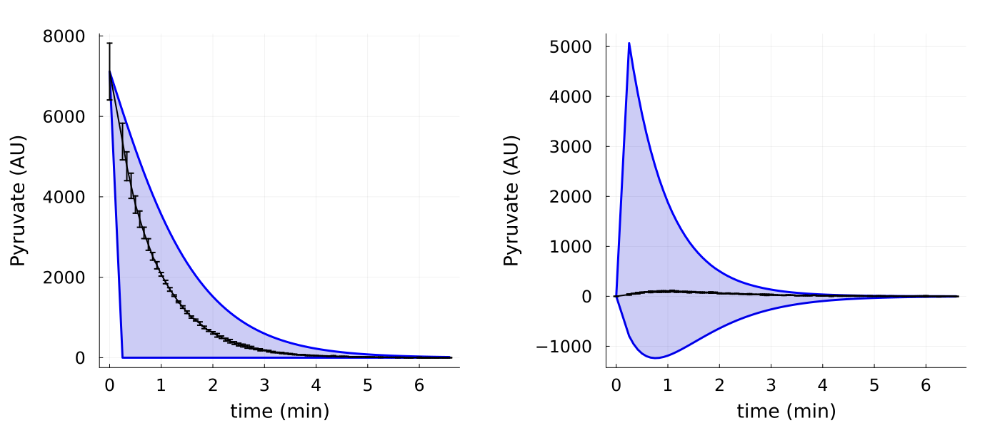

In [45]:

  pr = plot(tsC2./60, PriorQuant[1,1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2,1], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[2,1], fillrange=PriorQuant[1,1], label="", color="blue3", fillalpha=0.2)
  plot!(tsC2./60, dat[1][:,2], yerror = dat[1][:,3], linewidth = 2, colour = "black", label = "")

  po = plot(tsC2./60, PriorQuant[1,2], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2,2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[2,2], fillrange=PriorQuant[1,2], label="", color="blue3", fillalpha=0.2)
  plot!(tsC2./60, dat[1][:,4], yerror = dat[1][:,5], linewidth = 2, colour = "black", label = "")

  display(plot(pr, po, size = (1400, 600)))


In [106]:
poster

8000×7 Matrix{Float64}:
 0.00166607  0.273335    0.753669  0.0481251  51.0  41.0  130.097
 0.00177416  0.0187977   0.434469  0.381138   51.0  41.0   18.9414
 0.00151109  0.0357401   0.754919  0.0926483  51.0  41.0   80.2223
 0.00305009  0.158419    0.981812  0.0236615  51.0  41.0  275.133
 0.00295888  0.049243    0.901307  0.0342076  51.0  41.0  188.162
 0.00533132  0.0522765   0.877878  0.0123232  51.0  41.0  514.398
 0.00298739  0.0186947   0.457085  0.0322294  51.0  41.0  194.327
 0.00186172  0.0245844   0.729844  0.12033    51.0  41.0   56.2838
 0.00170408  0.11053     0.562622  0.053459   51.0  41.0  119.942
 0.00223127  0.0347176   0.658108  0.0616867  51.0  41.0  105.499
 ⋮                                                   ⋮    
 0.0104127   0.00438917  0.709445  0.014962   51.0  41.0  441.746
 0.0104127   0.00438917  0.709445  0.014962   51.0  41.0  441.746
 0.00940806  0.00571313  0.629486  0.0143253  51.0  41.0  455.791
 0.00303747  0.0347966   0.572101  0.0246868  51.0  41.0

## Posterior Prediction

In [46]:
posterSims = Array{Any}(undef, 8000)
tsC4 = dat4[:,1]
ts = 0:tsC4[end];
samps = convert.(Int, tsC4);

for i in 1:8000

    ivss = [dat4[1,2], 0, poster[i,7], 0, 0];
    SimOnTime2prior, SimOffTime2prior, SimAll2prior  = PyruvateHP_NMR_SolveAllMM(ts, vcat(poster[i,1:6], 0), ivss, samps);
    posterSims[i] = SimOnTime2prior;
end

In [47]:
restrucSim2 = zeros(size(posterSims[1])[1], size(posterSims[1])[2], size(posterSims)[1]);
for i in 1:8000
    restrucSim2[:,:,i] = posterSims[i][:,:,1]
end

In [48]:
# Dims = Up/Down, Observable, Experiment
PosterQuant = Array{Any}(undef,2,2);

PosterQuant[1,1] = [percentile(restrucSim2[j,1,:]+restrucSim2[j,2,:]+restrucSim2[j,4,:], 99.5) for j in 1:size(restrucSim2[:,k,1])[1]]; # Up
PosterQuant[2,1] = [percentile(restrucSim2[j,1,:]+restrucSim2[j,2,:]+restrucSim2[j,4,:], 0.5 ) for j in 1:size(restrucSim2[:,k,1])[1]]; # Down

PosterQuant[1,2] = [percentile(restrucSim2[j,5,:], 99.5) for j in 1:size(restrucSim2[:,5,1])[1]]; # Up
PosterQuant[2,2] = [percentile(restrucSim2[j,5,:], 0.5 ) for j in 1:size(restrucSim2[:,5,1])[1]]; # Down


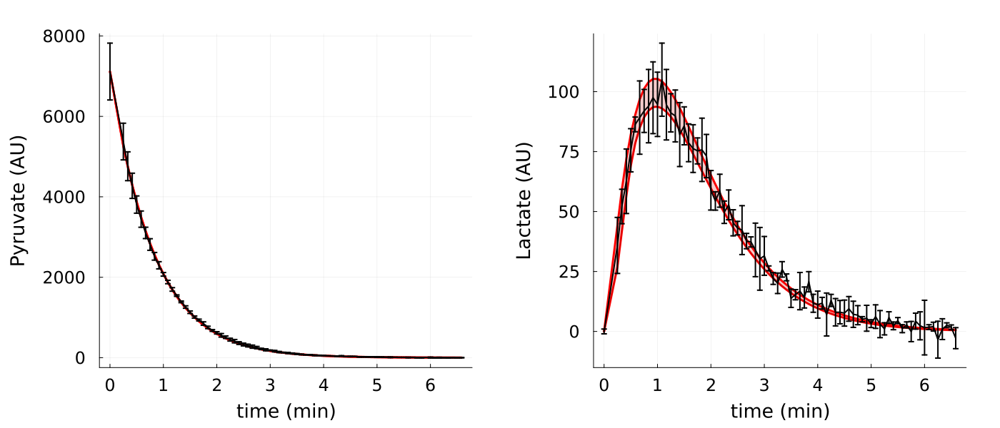

In [49]:

pr = plot(tsC2./60, PosterQuant[1,1], label = "", color = "red", linewidth = 3,
  margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
  xlabel = "time (min)", ylabel = "Pyruvate (AU)")
plot!(tsC2./60, PosterQuant[2,1], label = "", color = "red", linewidth = 3)
plot!(tsC2./60, PosterQuant[2,1], fillrange=PosterQuant[1,1], label="", color="red3", fillalpha=0.2)
plot!(tsC2./60, dat[1][:,2], yerror = dat[1][:,3], linewidth = 2, colour = "black", label = "")

po = plot(tsC2./60, PosterQuant[1,2], label = "", color = "red", linewidth = 3,
  margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
  xlabel = "time (min)", ylabel = "Lactate (AU)")
plot!(tsC2./60, PosterQuant[2,2], label = "", color = "red", linewidth = 3)
plot!(tsC2./60, PosterQuant[2,2], fillrange=PosterQuant[1,2], label="", color="red3", fillalpha=0.2)
plot!(tsC2./60, dat[1][:,4], yerror = dat[1][:,5], linewidth = 2, colour = "black", label = "")

display(plot(pr, po, size = (1400, 600)))


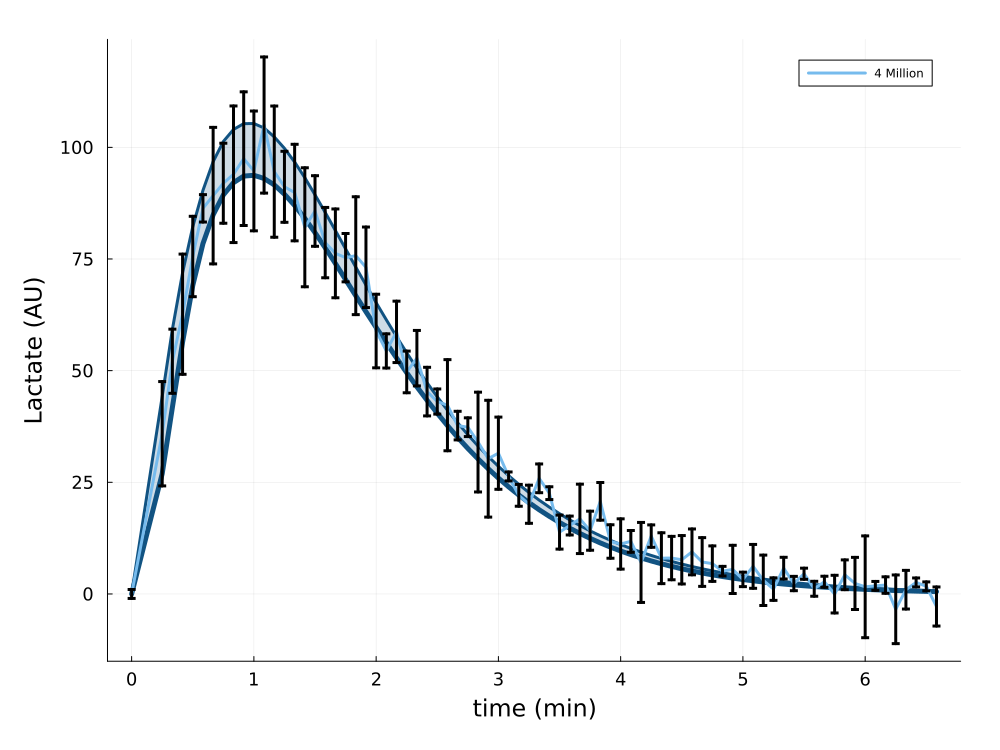

In [50]:
pp2 = plot(tsC2./60, PosterQuant[1,2], label = "", color = "#115382ff", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,2], label = "", color = "#115382ff", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,2], fillrange=PosterQuant[1,2], label="", color="#115382ff", fillalpha=0.2)
        plot!(tsC2./60, dat[1][:,4], yerror = dat[1][:,5], linewidth = 3, colour = "#76bbedff", label = "4 Million")


pFF = plot(pp2, size = (1000,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)


# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorPredictionLactateMichMent.svg")


display(pFF)

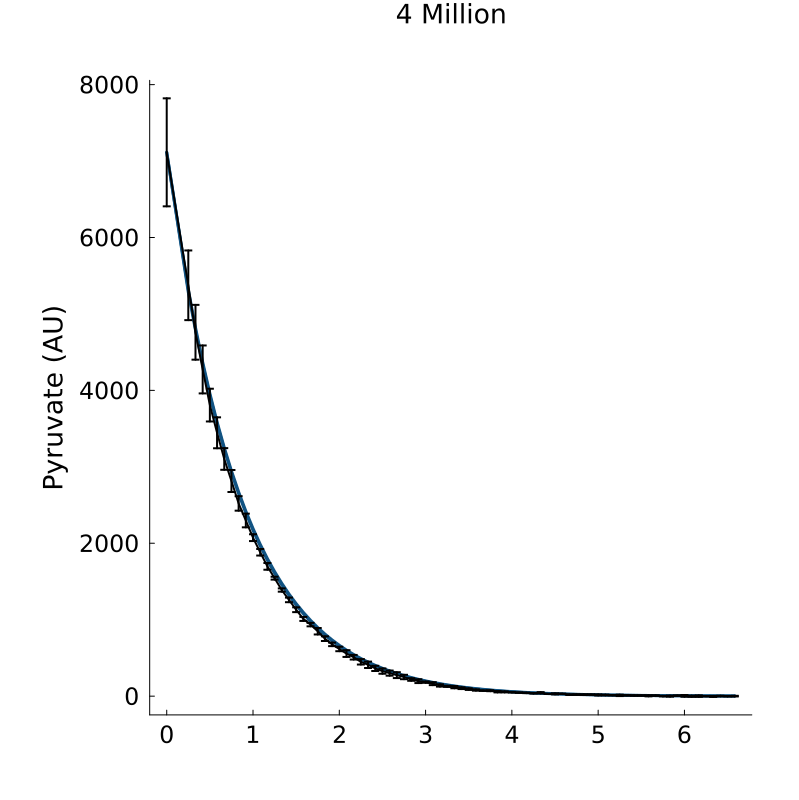

In [53]:

m=1
pr1 = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "#115382ff", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "", ylabel = "Pyruvate (AU)", grid = false, size = (1000,500), title = "4 Million")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "#115382ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="#115382ff", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")


PPR = plot(pr1, size = (800,800))

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SuppFig1Stuff\\PosteriorPredictionPyruvate.svg")

display(PPR)
